In [671]:
import pandas as pd
import numpy as np
import time
from sklearn.metrics import r2_score
from scipy.optimize import curve_fit
from scipy.optimize import leastsq
import scipy.optimize as opt
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

from sklearn.kernel_ridge import KernelRidge
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import gc

from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import GridSearchCV 
from sklearn.preprocessing import MinMaxScaler
import os

import scipy as sp

# _FOLDER = "/home/acq18mk/master/results/results/"
_FOLDER = "/home/juanjo/Work_Postdoc/my_codes_postdoc/DrugProfiles-master/results_with_NonAffecting_Drugs/"

### Coding Part

with open(_FOLDER + "drug_ids_50.txt", 'r') as f:
    drug_ids_50 = [np.int32(line.rstrip('\n')) for line in f]
    
# #columns to normalise:
# with open(_FOLDER+"columns_to_normalise.txt", 'r') as f:
#     columns_to_normalise = [line.rstrip('\n') for line in f]
# # *****************************************

with open(_FOLDER+"X_features_cancer_cell_lines.txt", 'r') as f:
    X_cancer_cell_lines = [line.rstrip('\n') for line in f]
# *****************************************

with open(_FOLDER+"X_PubChem_properties.txt", 'r') as f:
    X_PubChem_properties = [line.rstrip('\n') for line in f]
# *****************************************

with open(_FOLDER+"X_features_Targets.txt", 'r') as f:
    X_targets = [line.rstrip('\n') for line in f]
# *****************************************

with open(_FOLDER+"X_features_Target_Pathway.txt", 'r') as f:
    X_target_pathway = [line.rstrip('\n') for line in f]
# *****************************************

In [672]:
GDSC_Info = pd.read_csv(_FOLDER+"Cell_list_GDSC.csv")  #Contains info of cancer types for both GDSC1 and GDSC2

In [673]:
df_GDSC1 = GDSC_Info[GDSC_Info["Dataset"]=="GDSC1"] 

In [674]:
df_OneCancer = df_GDSC1[df_GDSC1["Tissue"]=="lung"].reset_index()
#df_OneCancer = df_GDSC1.copy().reset_index()

In [675]:
df_OneCancer["COSMICID"][0]

687596

In [676]:
all_columns = X_cancer_cell_lines + X_PubChem_properties + X_targets + X_target_pathway +["MAX_CONC"]

train_df = pd.read_csv(_FOLDER+"train08_merged_fitted_sigmoid4_123_with_drugs_properties_min10.csv").drop(["Unnamed: 0","Unnamed: 0.1"], axis=1)
test_df = pd.read_csv(_FOLDER+"test02_merged_fitted_sigmoid4_123_with_drugs_properties_min10.csv").drop(["Unnamed: 0","Unnamed: 0.1"], axis=1)               

train_df_50 = train_df.set_index("DRUG_ID").loc[drug_ids_50, :].copy()
test_df_50 = test_df.set_index("DRUG_ID").loc[drug_ids_50, :].copy()

datasets = ["Dataset 1", "Dataset 2", "Dataset 3", "Dataset 4"]

X_feat_dict = {"Dataset 1": X_cancer_cell_lines ,
               "Dataset 2": ["MAX_CONC"] + X_targets + X_target_pathway + X_cancer_cell_lines ,
               "Dataset 3": ["MAX_CONC"] + X_PubChem_properties +  X_cancer_cell_lines,
               "Dataset 4": ["MAX_CONC"] + X_PubChem_properties +  X_targets + X_target_pathway + X_cancer_cell_lines}

### Coefficient_1

train_drug = train_df_50.copy()
test_drug = test_df_50.copy()
  
data_set = "Dataset 4" 
X_columns = X_feat_dict[data_set]

In [677]:
df_train_drug_new = train_drug[train_drug["COSMIC_ID"]==df_OneCancer["COSMICID"][0]]
for i in range(1,df_OneCancer.shape[0]):
    df_aux = train_drug[train_drug["COSMIC_ID"]==df_OneCancer["COSMICID"][i]]
    df_train_drug_new = pd.concat([df_train_drug_new, df_aux])
    
df_test_drug_new = test_drug[test_drug["COSMIC_ID"]==df_OneCancer["COSMICID"][0]]
for i in range(1,df_OneCancer.shape[0]):
    df_aux = test_drug[test_drug["COSMIC_ID"]==df_OneCancer["COSMICID"][i]]
    df_test_drug_new = pd.concat([df_test_drug_new, df_aux])

In [678]:
df_train_drug_new = df_train_drug_new.reset_index()
df_test_drug_new = df_test_drug_new.reset_index()

In [679]:
scaler = MinMaxScaler().fit(df_train_drug_new[X_columns])
Xtrain_drug = scaler.transform(df_train_drug_new[X_columns])
Xtest_drug = scaler.transform(df_test_drug_new[X_columns])

y_train_drug = np.clip(df_train_drug_new["norm_cells_"+str(1)].values[:,None],1.0e-9,1.0)
y_test_drug =  np.clip(df_test_drug_new["norm_cells_"+str(1)].values[:,None],1.0e-9,1.0)
print(y_train_drug.shape)
for i in range(2,10):
    y_train_drug = np.concatenate((y_train_drug,np.clip(df_train_drug_new["norm_cells_"+str(i)].values[:,None],1.0e-9,1.0)),1)
    y_test_drug = np.concatenate((y_test_drug,np.clip(df_test_drug_new["norm_cells_"+str(i)].values[:,None],1.0e-9,1.0)),1)    

(9108, 1)


In [680]:
y_train_drug.shape

(9108, 9)

In [681]:
### Training data for the GP ###
output_dim = y_train_drug.shape[1]
N_per_out = Xtrain_drug.shape[0]
#aux_label_outputs = np.tile(np.arange(0,output_dim),(N_per_out,1)).T.reshape(-1) #Create labels for X
Xall = Xtrain_drug.copy()  #Here replicate (10,1) due to having ten outputs.
#Xtrain = np.concatenate((Xtrain,aux_label_outputs[:,None]),axis=1)
Yall = y_train_drug.copy()

### Testing data for the GP ###
N_per_out_test = Xtest_drug.shape[0]
#aux_label_outputs_test = np.tile(np.arange(0,output_dim),(N_per_out_test,1)).T.reshape(-1) #Create labels for X
Xtest = Xtest_drug.copy()  #Here replicate (10,1) due to having ten outputs.
#Xtest= np.concatenate((Xtest,aux_label_outputs_test[:,None]),axis=1)
Ytest = y_test_drug.copy()

In [682]:
"""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""
"""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""
def sigmoid_4_param(x, x0, L, k, d):
    """ Comparing with Dennis Wang's sigmoid:
    x0 -  p - position, correlation with IC50 or EC50
    L = 1 in Dennis Wang's sigmoid, protect from devision by zero if x is too small
    k = -1/s (s -shape parameter)
    d - determines the vertical position of the sigmoid - shift on y axis - better fitting then Dennis Wang's sigmoid

    """
    return ( 1/ (L + np.exp(-k*(x-x0))) + d)
"""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""
"""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""

'\n'

In [683]:
params_4_sig_train = df_train_drug_new["param_"+str(1)].values[:,None]
params_4_sig_test = df_test_drug_new["param_"+str(1)].values[:,None]
for i in range(2,5):
    params_4_sig_train = np.concatenate((params_4_sig_train,df_train_drug_new["param_"+str(i)].values[:,None]),1)
    params_4_sig_test = np.concatenate((params_4_sig_test,df_test_drug_new["param_"+str(i)].values[:,None]),1)

In [684]:
"""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""
"""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""
x_lin = np.linspace(0,1,1000)
x_lin_tile = np.tile(x_lin,(params_4_sig_train.shape[0],1))
#(x_lin,params_4_sig_train.shape[0],1).shape
Ydose_res = []
IC50_all = []
Ydose50_all = []
for i in range(params_4_sig_train.shape[0]):
    Ydose_res.append(sigmoid_4_param(x_lin_tile[i,:],*params_4_sig_train[i,:]))
    res1=(Ydose_res[i]<0.507)
    res2=(Ydose_res[i]>0.493)
    if (res1 & res2).sum()>0:
        Ydose50_all.append(Ydose_res[i][res1 & res2].mean())
        IC50_all.append(x_lin[res1 & res2].mean())
    else:
        Ydose50_all.append(x_lin[-1])
        IC50_all.append(x_lin[-1])

Ydose50_all = np.array(Ydose50_all)
IC50_all = np.array(IC50_all)
"""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""
"""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""

'\n'

In [685]:
apply = "None"  #This means we will
if apply == "log":
    IC50_all = np.log(IC50_all)  #
Yall = IC50_all.copy()

In [686]:
"Create a K-fold for cross-validation"
from sklearn.model_selection import KFold, cross_val_score
Xind = np.arange(N_per_out)
k_fold = KFold(n_splits=5,shuffle=True,random_state=0)

In [687]:
Nfold = 0
select_fold = 0#int(config.Nfold)
for train_id, val_id in k_fold.split(Xind):
    if Nfold == select_fold:
        print(f"Using Fold {Nfold}")
        Xval = Xall[val_id, :].copy()
        Xtrain = Xall[train_id, :].copy()
        Yval = Yall[val_id].copy()
        Ytrain = Yall[train_id].copy()
        break
    Nfold +=1

Using Fold 0


In [688]:
import math
import torch
import gpytorch
import tqdm
from matplotlib import pyplot as plt

%matplotlib inline
%load_ext autoreload
%autoreload 2

import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [689]:
_,Dim = Xtrain.shape
#train_x = 1/myDim*torch.randn((10000,myDim))

In [690]:
#train_x.sum(1)
#train_x.size(0)
train_x = torch.from_numpy(Xtrain.astype(np.float32))
train_y = torch.from_numpy(Ytrain.astype(np.float32))
val_x = torch.from_numpy(Xval.astype(np.float32))
val_y = torch.from_numpy(Yval.astype(np.float32))
#test_x = torch.from_numpy(Xtest.astype(np.float32))
#test_y = torch.from_numpy(Ytest.astype(np.float32))

In [691]:
print(train_x.shape, train_y.shape)

from torch.utils.data import TensorDataset, DataLoader
train_dataset = TensorDataset(train_x, train_y)
train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)

#test_dataset = TensorDataset(test_x, test_y)
#test_loader = DataLoader(test_dataset, batch_size=50, shuffle=False)

torch.Size([7286, 1352]) torch.Size([7286])


In [692]:
from gpytorch.models import ApproximateGP
from gpytorch.variational import CholeskyVariationalDistribution
from gpytorch.variational import VariationalStrategy

split_dim = 2

class GPModel(ApproximateGP):
    def __init__(self, inducing_points):
        variational_distribution = CholeskyVariationalDistribution(inducing_points.size(0))
        variational_strategy = VariationalStrategy(self, inducing_points, variational_distribution, learn_inducing_locations=True)
        super(GPModel, self).__init__(variational_strategy)
        self.mean_module = gpytorch.means.ConstantMean()
        
        size_dims = (Dim)//split_dim

        #mykern = gpytorch.kernels.LinearKernel(active_dims=torch.tensor(list(np.arange(0,size_dims))),ard_num_dims=size_dims)+ gpytorch.kernels.MaternKernel(nu=0.5,active_dims=torch.tensor(list(np.arange(0,size_dims))),ard_num_dims=size_dims)
        mykern = gpytorch.kernels.MaternKernel(nu=0.5,active_dims=torch.tensor(list(np.arange(0,size_dims))),ard_num_dims=size_dims)
        for i in range(1,split_dim):
            if i != (split_dim-1):
                #mykern = mykern+gpytorch.kernels.LinearKernel(active_dims=torch.tensor(list(np.arange(size_dims*i,size_dims*i+size_dims))),batch_shape=torch.Size([num_latents]),ard_num_dims=size_dims) + gpytorch.kernels.MaternKernel(nu=0.5,active_dims=torch.tensor(list(np.arange(size_dims*i,size_dims*i+size_dims))),ard_num_dims=size_dims)
                mykern = mykern + gpytorch.kernels.MaternKernel(nu=0.5,active_dims=torch.tensor(list(np.arange(size_dims*i,size_dims*i+size_dims))),ard_num_dims=size_dims)
                #print(torch.tensor(list(np.arange(size_dims*i,size_dims*i+size_dims))))
            else:
                last_dims = Dim - size_dims*i
                #mykern = mykern+gpytorch.kernels.LinearKernel(active_dims=torch.tensor(list(np.arange(size_dims*i,Dim))),ard_num_dims=last_dims) + gpytorch.kernels.MaternKernel(nu=0.5,active_dims=torch.tensor(list(np.arange(size_dims*i,Dim))),ard_num_dims=last_dims)
                mykern = mykern + gpytorch.kernels.MaternKernel(nu=0.5,active_dims=torch.tensor(list(np.arange(size_dims*i,Dim))),ard_num_dims=last_dims)
                #print(torch.tensor(list(np.arange(size_dims*i,Dim))))
        
        self.covar_module = gpytorch.kernels.ScaleKernel(mykern)

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

inducing_points = train_x[:1500, :]
model = GPModel(inducing_points=inducing_points)
likelihood = gpytorch.likelihoods.GaussianLikelihood(noise_constraint=gpytorch.constraints.Interval(1.0e-5, 1.0e-3))

In [693]:
#likelihood(model(train_x)).rsample().shape

In [694]:
#state_dict = torch.load('model_MaternLinear_WithNonAffectDrug_Bernoulli.pth')
#model.load_state_dict(state_dict)

In [750]:
# this is for running the notebook in our testing framework
import os
smoke_test = ('CI' in os.environ)
num_epochs = 1 if smoke_test else 4


model.train()
likelihood.train()

optimizer = torch.optim.Adam([
    {'params': model.parameters()},
    {'params': likelihood.parameters()},
], lr=0.001)

# Our loss object. We're using the VariationalELBO, which essentially just computes the ELBO
mll = gpytorch.mlls.VariationalELBO(likelihood, model, num_data=train_y.size(0))

# We use more CG iterations here because the preconditioner introduced in the NeurIPS paper seems to be less
# effective for VI.
# epochs_iter = tqdm.tqdm_notebook(range(num_epochs), desc="Epoch")
# for i in epochs_iter:
#     # Within each iteration, we will go over each minibatch of data
#     optimizer.zero_grad()
#     output = model(train_x)
#     loss = -mll(output, train_y)
#     epochs_iter.set_postfix(loss=loss.item())
#     loss.backward()
#     optimizer.step()

epochs_iter = tqdm.notebook.tqdm(range(num_epochs), desc="Epoch")
for i in epochs_iter:
    # Within each iteration, we will go over each minibatch of data
    minibatch_iter = tqdm.notebook.tqdm(train_loader, desc="Minibatch", leave=False)
    for x_batch, y_batch in minibatch_iter:
        optimizer.zero_grad()
        output = model(x_batch)
        loss = -mll(output, y_batch)
        minibatch_iter.set_postfix(loss=loss.item())
        loss.backward()
        optimizer.step()


Epoch:   0%|          | 0/4 [00:00<?, ?it/s]

Minibatch:   0%|          | 0/73 [00:00<?, ?it/s]

Minibatch:   0%|          | 0/73 [00:00<?, ?it/s]

Minibatch:   0%|          | 0/73 [00:00<?, ?it/s]

Minibatch:   0%|          | 0/73 [00:00<?, ?it/s]

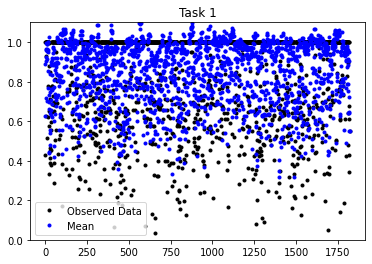

In [745]:
#from torch.distributions import base_distributions
# Set into eval mode
model.eval()
likelihood.eval()

# Initialize plots
#fig, axs = plt.subplots(1, num_tasks, figsize=(4 * num_tasks, 3))

# Make predictions
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    #test_x = torch.linspace(0, 1, 51)
    mean = likelihood(model(val_x)).mean
    predictions_gp = model(val_x)
    #mean = likelihood(predictions_gp.mean)
    #mean = predictions_gp.mean
    lower, upper = predictions_gp.confidence_region()
    #lower = torch.distributions.Normal(0, 1).cdf(predictions_gp.mean-2*predictions_gp.stddev)
    #upper = torch.distributions.Normal(0, 1).cdf(predictions_gp.mean+2*predictions_gp.stddev)

for task in range(1):
    # Plot training data as black stars
    plt.figure(task)
    plt.plot(val_y[:].detach().numpy(), 'k.')
    # Predictive mean as blue line
    plt.plot(mean[:].numpy(), '.b')
    # Shade in confidence
    #ax.fill_between(test_x.numpy(), lower[:, task].numpy(), upper[:, task].numpy(), alpha=0.5)
    plt.ylim([0, 1.1])
    plt.legend(['Observed Data', 'Mean', 'Confidence'])
    plt.title(f'Task {task + 1}')

# #fig.tight_layout()
# None

(-1.0, 2.0)

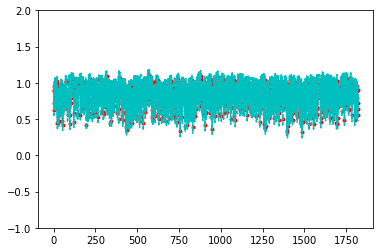

In [746]:
plt.plot(predictions_gp.mean,'.r')
plt.plot(predictions_gp.mean+2*predictions_gp.stddev,'--c')
plt.plot(predictions_gp.mean-2*predictions_gp.stddev,'--c')
plt.ylim([-1,2])

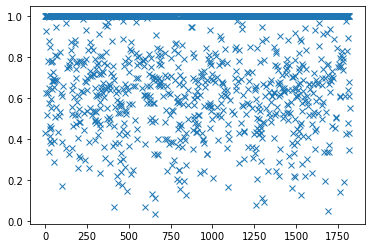

In [747]:
plt.plot(IC50_Y_Val,'x')

In [748]:
mean_pred_exp = mean.numpy()
if apply=="log":  #Here it means we reverse the log by applying exp
    mean_pred_exp = np.exp(mean.numpy())
    IC50_all_exp = np.exp(IC50_all)

In [749]:
saturated_mean = mean_pred_exp.copy()
saturated_mean[saturated_mean>1.0] = 1.0

IC50_Y_Val = IC50_all_exp[val_id]
print("Saturated IC50 MSE:",np.mean((IC50_Y_Val-saturated_mean)**2))
print("IC50 MSE:",np.mean((IC50_Y_Val-mean_pred_exp)**2))
pos_NonAffect = IC50_Y_Val==1.0
pos_Affect = pos_NonAffect==False
print("IC50 MSE val NonAffect:",np.mean((IC50_Y_Val[pos_NonAffect]-saturated_mean[pos_NonAffect])**2))
print("IC50 MSE val Affect:",np.mean((IC50_Y_Val[pos_Affect]-saturated_mean[pos_Affect])**2))

Saturated IC50 MSE: 0.025708271464397015
IC50 MSE: 0.02594631739371889
IC50 MSE val NonAffect: 0.015472325631824211
IC50 MSE val Affect: 0.04144710739637525


In [206]:
(pos_NonAffect.sum()*0.0238982+pos_Affect.sum()*0.0299389)/(pos_NonAffect.sum()+pos_Affect.sum())

0.026143973695771556

In [36]:
Nrow = 107//2
Ncolumn = 4
#fig, axs = plt.subplots(Nrow, Ncolumn, figsize=(300,400*(Nrow//10))) #to save bigger
fig, axs = plt.subplots(Nrow, Ncolumn, figsize=(100,150*(Nrow//10)))
Nval = val_y.numpy().shape[0]
Ndose = int(Nval/9)
#test_y, mean
posy = 0  #we show 214 images
for i in range(Nrow):
    for j in range(Ncolumn): 
        #posy = np.random.randint(val_y.shape[0])
        val_dose = np.array([Yval_orig[posy],Yval_orig[posy+Ndose],Yval_orig[posy+2*Ndose],Yval_orig[posy+3*Ndose],Yval_orig[posy+4*Ndose],Yval_orig[posy+5*Ndose],Yval_orig[posy+6*Ndose],Yval_orig[posy+7*Ndose],Yval_orig[posy+8*Ndose]])
        pred_dose = np.array([mean[posy],mean[posy+Ndose],mean[posy+2*Ndose],mean[posy+3*Ndose],mean[posy+4*Ndose],mean[posy+5*Ndose],mean[posy+6*Ndose],mean[posy+7*Ndose],mean[posy+8*Ndose]])
        val_conc = np.array([val_x[posy,-1],val_x[posy+Ndose,-1],val_x[posy+2*Ndose,-1],val_x[posy+3*Ndose,-1],val_x[posy+4*Ndose,-1],val_x[posy+5*Ndose,-1],val_x[posy+6*Ndose,-1],val_x[posy+7*Ndose,-1],val_x[posy+8*Ndose,-1]])
        lower_dose = np.array([lower[posy],lower[posy+Ndose],lower[posy+2*Ndose],lower[posy+3*Ndose],lower[posy+4*Ndose],lower[posy+5*Ndose],lower[posy+6*Ndose],lower[posy+7*Ndose],lower[posy+8*Ndose]])
        upper_dose = np.array([upper[posy],upper[posy+Ndose],upper[posy+2*Ndose],upper[posy+3*Ndose],upper[posy+4*Ndose],upper[posy+5*Ndose],upper[posy+6*Ndose],upper[posy+7*Ndose],upper[posy+8*Ndose]])
        axs[i, j].plot(val_conc, val_dose,'xb',linewidth=20,markersize=80)
        axs[i, j].plot(val_conc, val_dose,'.b',linewidth=20,markersize=80)
        axs[i, j].plot(val_conc, pred_dose,'-r',linewidth=20,markersize=80)
        axs[i, j].set_ylim([-0.05,1.05])
        axs[i,j].set_title("R2-score = "+str(np.round(r2_score(val_dose, pred_dose, multioutput='raw_values')[0],4))+ ", MSE = "+str( np.round( np.mean((val_dose-pred_dose)**2),5)),size=180)
        axs[i, j].plot(val_conc, lower_dose,'--c',linewidth=20,markersize=80)
        axs[i, j].plot(val_conc, upper_dose,'--c',linewidth=20,markersize=80)
        axs[i, j].xaxis.set_tick_params(labelsize=130)
        axs[i, j].yaxis.set_tick_params(labelsize=130)

        #axs[i, j].set_title("r2 = "+str(r2_scr[posy,:]))
        posy = posy + 1
        if posy == 16397//9:
            break
    if posy == 16397//9:
        break
#plt.xticks(size = 50)
#plt.yticks(size = 50)
#plt.tight_layout()
print(posy)
#fig.savefig('Predictions_1696-1908.pdf',dpi=300)

212


In [103]:
from sklearn import metrics
Nrow = 107//2
Ncolumn = 4
#fig, axs = plt.subplots(Nrow, Ncolumn, figsize=(300,400*(Nrow//10)))
Nval = val_y.numpy().shape[0]
Ndose = int(Nval/9)
#test_y, mean
posy = 0  #we show 214 images
R2_score = []
MSE_score = []
Emax_score = []
myAUC_Err = []

from scipy.interpolate import interp1d
x_dose = np.linspace(0.111111,1.0,9)
x_dose_new = np.linspace(0.111111,1.0,1000)
Ydose50_val = []
IC50_val = []
params_4_sig_val = params_4_sig_train[val_id,:]

for posy in range(Ndose):
    val_dose = np.array([Yval_orig[posy],Yval_orig[posy+Ndose],Yval_orig[posy+2*Ndose],Yval_orig[posy+3*Ndose],Yval_orig[posy+4*Ndose],Yval_orig[posy+5*Ndose],Yval_orig[posy+6*Ndose],Yval_orig[posy+7*Ndose],Yval_orig[posy+8*Ndose]])
    pred_dose = np.array([mean[posy],mean[posy+Ndose],mean[posy+2*Ndose],mean[posy+3*Ndose],mean[posy+4*Ndose],mean[posy+5*Ndose],mean[posy+6*Ndose],mean[posy+7*Ndose],mean[posy+8*Ndose]])
    val_conc = np.array([val_x[posy,-1],val_x[posy+Ndose,-1],val_x[posy+2*Ndose,-1],val_x[posy+3*Ndose,-1],val_x[posy+4*Ndose,-1],val_x[posy+5*Ndose,-1],val_x[posy+6*Ndose,-1],val_x[posy+7*Ndose,-1],val_x[posy+8*Ndose,-1]])
    #lower_dose = np.array([lower[posy],lower[posy+Ndose],lower[posy+2*Ndose],lower[posy+3*Ndose],lower[posy+4*Ndose],lower[posy+5*Ndose],lower[posy+6*Ndose],lower[posy+7*Ndose],lower[posy+8*Ndose]])
    #upper_dose = np.array([upper[posy],upper[posy+Ndose],upper[posy+2*Ndose],upper[posy+3*Ndose],upper[posy+4*Ndose],upper[posy+5*Ndose],upper[posy+6*Ndose],upper[posy+7*Ndose],upper[posy+8*Ndose]])
    R2_score.append(r2_score(val_dose, pred_dose, multioutput='raw_values')[0])
    MSE_score.append(np.mean((val_dose-pred_dose)**2)) 
    Emax_score.append( np.abs(np.mean(val_dose[-2:])-np.mean(pred_dose[-2:]))  )   
    
    #Compute IC50
    y_resp = pred_dose.copy()
    f = interp1d(x_dose, y_resp)
    f2 = interp1d(x_dose, y_resp, kind='quadratic')

    y_resp_interp = f2(x_dose_new)
    res1 = y_resp_interp<0.507
    res2 = y_resp_interp>0.493
    if (res1 & res2).sum()>0:
        Ydose50_val.append( y_resp_interp[res1 & res2].mean())
        IC50_val.append( x_dose_new[res1 & res2].mean())
    else:
        Ydose50_val.append( x_dose_new[-1])
        IC50_val.append( x_dose_new[-1])
    
    y_resp_interp_label = sigmoid_4_param(x_dose_new,*params_4_sig_val[posy,:])
    
    AUC_val = metrics.auc(x_dose_new,y_resp_interp_label)
    AUC_pred = metrics.auc(x_dose_new, y_resp_interp)
    #AUC_val = metrics.auc(val_conc,val_dose)
    #AUC_pred = metrics.auc(val_conc,pred_dose)
    myAUC_Err.append(np.abs(AUC_val-AUC_pred))
    
print(posy)

1821


In [95]:
np.array(Ydose_res).shape

(9108, 1000)

In [104]:
np.median(myAUC_Err)
#R2_score

0.06791583069451179

NameError: name 'pos_WithAffectDrug' is not defined

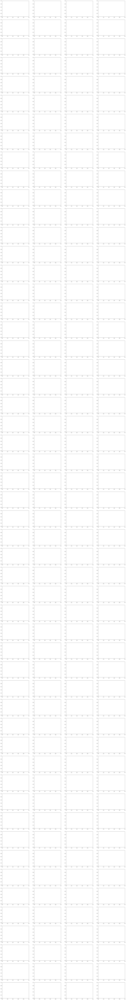

In [28]:
#Here we plot the prediction where we would expect drug response
Nrow = 107//2
Ncolumn = 4
fig, axs = plt.subplots(Nrow, Ncolumn, figsize=(30,50*(Nrow//10)))

#test_y, mean
posy = 0  #we show 214 images
for i in range(Nrow):
    for j in range(Ncolumn): 
        #posy = np.random.randint(val_y.shape[0])
        axs[i, j].plot(np.linspace(0.11,1,9), val_y[pos_WithAffectDrug[posy],:],'xb')
        axs[i, j].plot(np.linspace(0.11,1,9), val_y[pos_WithAffectDrug[posy],:],'.b')
        axs[i, j].plot(np.linspace(0.11,1,9), mean[pos_WithAffectDrug[posy],:],'-r')
        axs[i, j].plot(np.linspace(0.11,1,9), lower[pos_WithAffectDrug[posy],:],'--c')
        axs[i, j].plot(np.linspace(0.11,1,9), upper[pos_WithAffectDrug[posy],:],'--c')
        axs[i, j].set_title("r2 = "+str(r2_scr[pos_WithAffectDrug[posy],:]))
        posy = posy + 1
        #if posy == 855:
        #    break

print(posy)
#fig.savefig('validation_0-212.jpg',dpi=150)

In [24]:
Nval = val_y.numpy().shape[0]
Ndose = int(Nval/9)
val_dose_all=np.zeros((Ndose,9))
pred_dose_all = np.zeros((Ndose,9))
for posy in range(Yval_orig.shape[0]//9):
    val_dose_all[posy,:] = np.array([Yval_orig[posy],Yval_orig[posy+Ndose],Yval_orig[posy+2*Ndose],Yval_orig[posy+3*Ndose],Yval_orig[posy+4*Ndose],Yval_orig[posy+5*Ndose],Yval_orig[posy+6*Ndose],Yval_orig[posy+7*Ndose],Yval_orig[posy+8*Ndose]])
    pred_dose_all[posy,:] = np.array([mean[posy],mean[posy+Ndose],mean[posy+2*Ndose],mean[posy+3*Ndose],mean[posy+4*Ndose],mean[posy+5*Ndose],mean[posy+6*Ndose],mean[posy+7*Ndose],mean[posy+8*Ndose]])
    #val_conc_all = np.array([val_x[posy,-1],val_x[posy+Ndose,-1],val_x[posy+2*Ndose,-1],val_x[posy+3*Ndose,-1],val_x[posy+4*Ndose,-1],val_x[posy+5*Ndose,-1],val_x[posy+6*Ndose,-1],val_x[posy+7*Ndose,-1],val_x[posy+8*Ndose,-1]])
    #lower_dose_all = np.array([lower[posy],lower[posy+Ndose],lower[posy+2*Ndose],lower[posy+3*Ndose],lower[posy+4*Ndose],lower[posy+5*Ndose],lower[posy+6*Ndose],lower[posy+7*Ndose],lower[posy+8*Ndose]])
    #upper_dose_all = np.array([upper[posy],upper[posy+Ndose],upper[posy+2*Ndose],upper[posy+3*Ndose],upper[posy+4*Ndose],upper[posy+5*Ndose],upper[posy+6*Ndose],upper[posy+7*Ndose],upper[posy+8*Ndose]])

In [25]:
#torch.save(model.state_dict(), 'model_MaternLinear_WithNonAffectDrug_Bernoulli.pth')

8


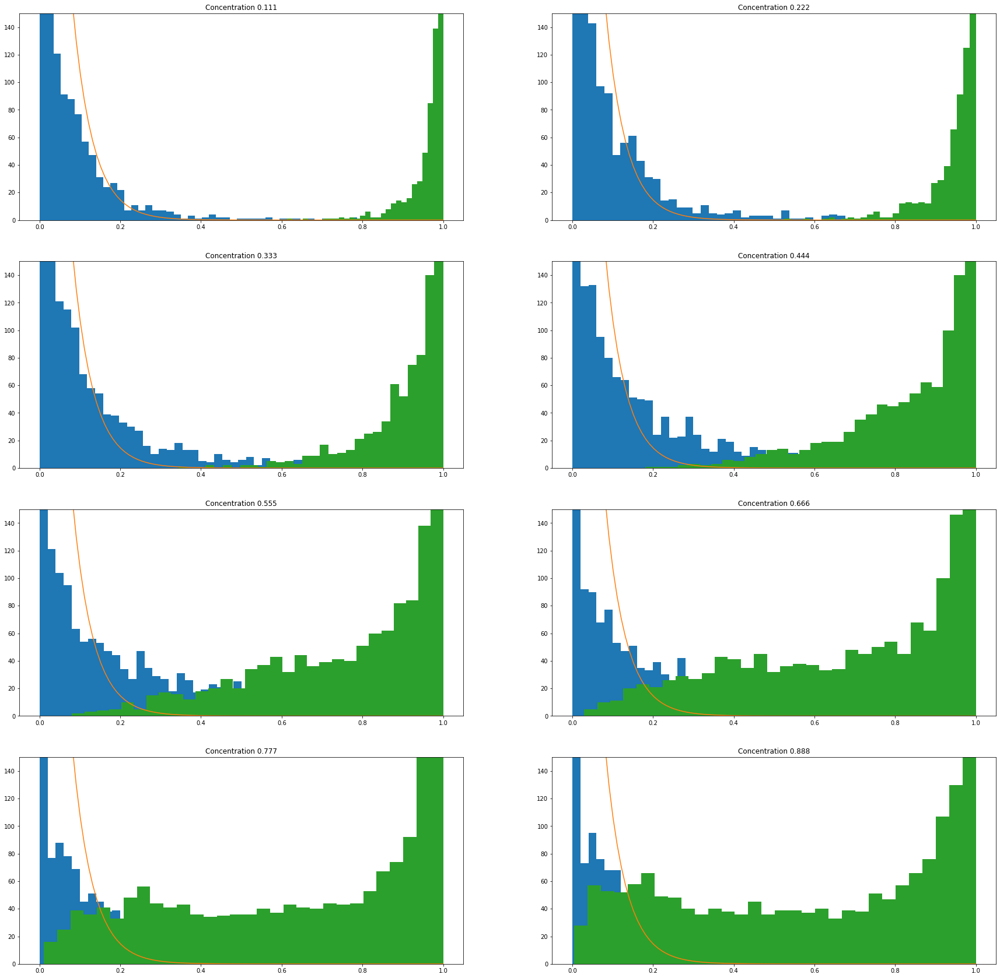

In [54]:
import matplotlib.pyplot as plt
import scipy.stats as stats 
concent = [0.111,0.222,0.333,0.444,0.555,0.666,0.777,0.888,1.0]
Nrow = 4
Ncolumn = 2
fig, axs = plt.subplots(Nrow, Ncolumn, figsize=(30,30))

x = np.linspace (0, 1, 100) 
#test_y, mean
posy = 0  #we show 214 images
for i in range(Nrow):
    for j in range(Ncolumn): 
        #posy = np.random.randint(val_y.shape[0])
        #axs[i, j].hist(train_y[:,posy].numpy(),bins=50)
        axs[i, j].hist(-1*val_dose_all[:,posy]+1,bins=50)
        axs[i, j].plot(x,stats.expon.pdf(x, 0,0.05)*40)
        axs[i, j].hist(pred_dose_all[:,posy],bins=30)
        axs[i, j].set_title(f"Concentration {concent[posy]}")
        posy = posy + 1
        axs[i,j].set_ylim([0,150])
print(posy)